## Importing Necessary Libraries

In [2]:
import os
from tqdm import tqdm

import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()


from sklearn.preprocessing import OneHotEncoder, LabelEncoder,MinMaxScaler,StandardScaler
from sklearn.utils import class_weight
from sklearn.model_selection import StratifiedKFold, KFold, train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, HistGradientBoostingClassifier
from sklearn.experimental import enable_hist_gradient_boosting
from sklearn.ensemble import HistGradientBoostingClassifier


from sklearn.metrics import accuracy_score, roc_auc_score

/opt/conda/lib/python3.7/site-packages/sklearn/experimental/enable_hist_gradient_boosting.py:17: UserWarning: Since version 1.0, it is not needed to import enable_hist_gradient_boosting anymore. HistGradientBoostingClassifier and HistGradientBoostingRegressor are now stable and can be normally imported from sklearn.ensemble.
  "Since version 1.0, "


In [3]:
path = os.path.join(os.getcwd(), "diabetes.csv")
df = pd.read_csv(path)

label_col = "Outcome"
cat_cols = ["Pregnancies"]
cont_cols = ["Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI", "DiabetesPedigreeFunction", "Age"]

N_SPLITS = 5
SEED = 2022

df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


## Data Visualization

In [4]:
train_report = ProfileReport(df, title="Training Data Visualization")
train_report.to_file(f"./train_metadata.html")
train_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

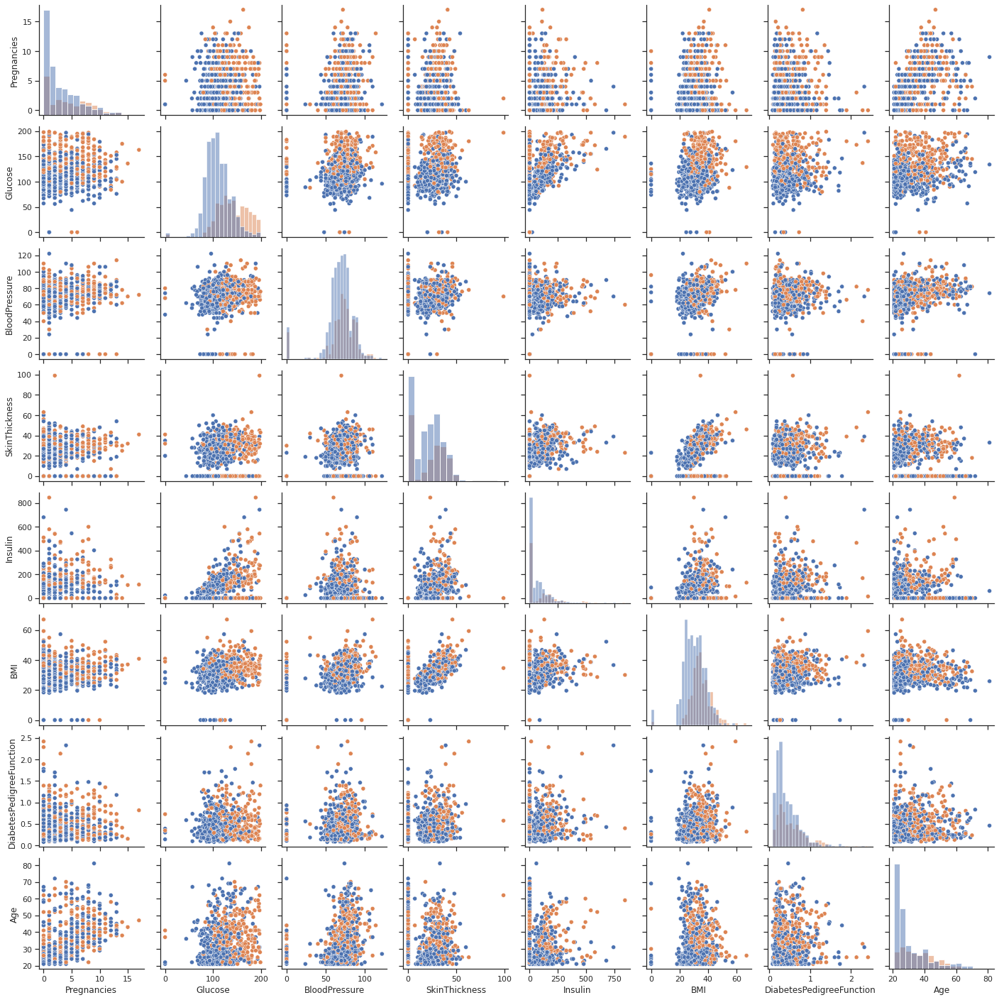

In [5]:
sns.set_theme(style="ticks")

ax = sns.PairGrid(df, hue="Outcome", diag_sharey=False)
ax.map_diag(sns.histplot)
ax.map_offdiag(sns.scatterplot)

## Data Preprocessing

In [6]:
encoders = {}

def preprocess_df(df, cat_features, cont_features, data = "train"):
    for col in cat_features:
        if data == "train":
            cat_encoder = LabelEncoder()
            df[col] = cat_encoder.fit_transform(np.array(df[col]).reshape(-1, 1))
            encoders[col] = cat_encoder
        else:
            df[col] = encoders[col].transform(np.array(df[col]).reshape(-1, 1))
            

    for col in cont_features: 
        if data == "train":
            cont_encoder = MinMaxScaler()
            df[col] = cont_encoder.fit_transform(np.array(df[col]).reshape(-1, 1))
            encoders[col] = cont_encoder
        else:
            df[col] = encoders[col].transform(np.array(df[col]).reshape(-1, 1))
            

    return df

In [7]:
train_df = preprocess_df(df, cat_cols, cont_cols, data = "train")

train_df, test_df, _, _ = train_test_split(df,list(df[label_col]), test_size=0.1, stratify=list(df[label_col]), random_state=SEED) 

train_df.reset_index(inplace=True)
test_df.reset_index(inplace=True)

train_labels = train_df[label_col]
train_df = train_df.drop(label_col, axis=1)

test_labels = test_df[label_col]
test_df = test_df.drop(label_col, axis=1)

/opt/conda/lib/python3.7/site-packages/sklearn/preprocessing/_label.py:115: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


## Training

In [8]:
kfold = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=SEED)

model_names = ["Logistic Regression", "SVM", "KNN", "Decision Tree", "Random Forest", "Histogram Gradient Boosting"]
models = [
    LogisticRegression(random_state=SEED),
    SVC(gamma='auto',random_state=SEED, probability=True),
    KNeighborsClassifier(n_neighbors=5),
    DecisionTreeClassifier(random_state=SEED),
    RandomForestClassifier(max_depth=2, random_state=SEED),
    HistGradientBoostingClassifier(random_state=SEED)
]

for j,model in enumerate(models):
    test_preds = 0
    print(f"\n\n-------------------Model: {model_names[j]}------------------------\n")
    for i, (train_idx,test_idx) in enumerate(kfold.split(train_df,train_labels)):
        print(' Running {} of KFold {}'.format(i+1,kfold.n_splits))
        xtr,xvl = train_df.loc[train_idx],train_df.loc[test_idx]
        ytr,yvl = train_labels.loc[train_idx],train_labels.loc[test_idx]
        
        model.fit(xtr,ytr)
        test_preds += model.predict_proba(test_df)
        print(f"KFold : {i+1}/{N_SPLITS} || Test Data ROC AUC Score: {roc_auc_score(test_labels,model.predict_proba(test_df)[:,-1])}")
    
    test_preds = test_preds/N_SPLITS
    print(f"\n\n Overall Performance:- Test Data ROC AUC Score: {roc_auc_score(test_labels,test_preds[:,-1])} \n\n")



-------------------Model: Logistic Regression------------------------

 Running 1 of KFold 5
KFold : 1/5 || Test Data ROC AUC Score: 0.7851851851851851
 Running 2 of KFold 5
KFold : 2/5 || Test Data ROC AUC Score: 0.7725925925925926
 Running 3 of KFold 5
KFold : 3/5 || Test Data ROC AUC Score: 0.7755555555555556
 Running 4 of KFold 5
KFold : 4/5 || Test Data ROC AUC Score: 0.7762962962962963
 Running 5 of KFold 5
KFold : 5/5 || Test Data ROC AUC Score: 0.7748148148148148


 Overall Performance:- Test Data ROC AUC Score: 0.777037037037037 




-------------------Model: SVM------------------------

 Running 1 of KFold 5


/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


KFold : 1/5 || Test Data ROC AUC Score: 0.5681481481481481
 Running 2 of KFold 5
KFold : 2/5 || Test Data ROC AUC Score: 0.7125925925925926
 Running 3 of KFold 5
KFold : 3/5 || Test Data ROC AUC Score: 0.6433333333333333
 Running 4 of KFold 5
KFold : 4/5 || Test Data ROC AUC Score: 0.6496296296296297
 Running 5 of KFold 5
KFold : 5/5 || Test Data ROC AUC Score: 0.617037037037037


 Overall Performance:- Test Data ROC AUC Score: 0.6570370370370371 




-------------------Model: KNN------------------------

 Running 1 of KFold 5
KFold : 1/5 || Test Data ROC AUC Score: 0.5155555555555555
 Running 2 of KFold 5
KFold : 2/5 || Test Data ROC AUC Score: 0.6148148148148148
 Running 3 of KFold 5
KFold : 3/5 || Test Data ROC AUC Score: 0.6396296296296295
 Running 4 of KFold 5
KFold : 4/5 || Test Data ROC AUC Score: 0.5744444444444444
 Running 5 of KFold 5
KFold : 5/5 || Test Data ROC AUC Score: 0.6014814814814815


 Overall Performance:- Test Data ROC AUC Score: 0.6022222222222222 




----------